## Download (if required) all the necessary libraries

In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
%matplotlib inline

## Load the data and convert categorical columns to numerical values

In [13]:
data = pd.read_csv('customer_churn_large_dataset_new.csv')

In [15]:
data

,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
0,1,Customer_1,63,Male,Los Angeles,17,73.36,236,0
1,2,Customer_2,62,Female,New York,1,48.76,172,0
2,3,Customer_3,24,Female,Los Angeles,5,85.47,460,0
3,4,Customer_4,36,Female,Miami,3,97.94,297,1
4,5,Customer_5,46,Female,Miami,19,58.14,266,0
...,...,...,...,...,...,...,...,...,...
99995,99996,Customer_99996,33,Male,Houston,23,55.13,226,1
99996,99997,Customer_99997,62,Female,New York,19,61.65,351,0
99997,99998,Customer_99998,64,Male,Chicago,17,96.11,251,1
99998,99999,Customer_99999,51,Female,New York,20,49.25,434,1


In [17]:
data['Gender'] = data['Gender'].apply(lambda x : 0 if x == "Male" else 1)

In [20]:
data['Location'].unique()

array(['Los Angeles', 'New York', 'Miami', 'Chicago', 'Houston'],
      dtype=object)

In [22]:
data['Location'] = data['Location'].apply(lambda x : 0 if x == "Los Angeles" else (1 if x == "New York" else (2 if x == 'Miami' else (3 if x == 'Chicago' else 4))))

In [23]:
data

,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
0,1,Customer_1,63,0,0,17,73.36,236,0
1,2,Customer_2,62,1,1,1,48.76,172,0
2,3,Customer_3,24,1,0,5,85.47,460,0
3,4,Customer_4,36,1,2,3,97.94,297,1
4,5,Customer_5,46,1,2,19,58.14,266,0
...,...,...,...,...,...,...,...,...,...
99995,99996,Customer_99996,33,0,4,23,55.13,226,1
99996,99997,Customer_99997,62,1,1,19,61.65,351,0
99997,99998,Customer_99998,64,0,3,17,96.11,251,1
99998,99999,Customer_99999,51,1,1,20,49.25,434,1


## Check for NaN values OR Null values in the given data

In [44]:
data.isna().sum()

CustomerID                    0
Name                          0
Age                           0
Gender                        0
Location                      0
Subscription_Length_Months    0
Monthly_Bill                  0
Total_Usage_GB                0
Churn                         0
dtype: int64

In [45]:
data.isnull().sum()

CustomerID                    0
Name                          0
Age                           0
Gender                        0
Location                      0
Subscription_Length_Months    0
Monthly_Bill                  0
Total_Usage_GB                0
Churn                         0
dtype: int64

## Check for outliers using boxplots

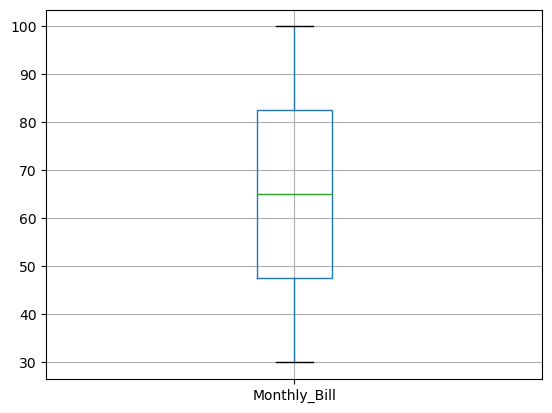

In [64]:
data.boxplot(column='Monthly_Bill')
plt.show()

In [50]:
data[(data['Monthly_Bill'] > 100) | (data['Monthly_Bill'] < 30)]

,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn


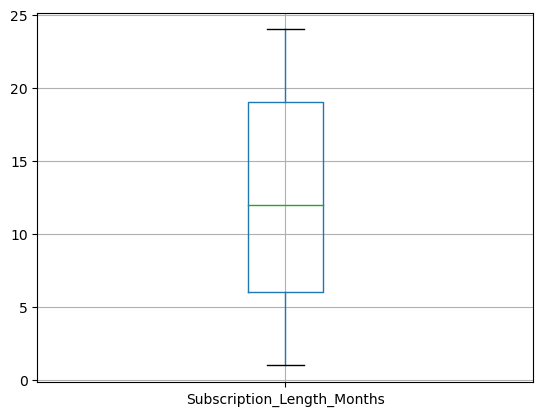

In [75]:
data.boxplot(column = 'Subscription_Length_Months')
plt.show()

In [69]:
data[(data['Subscription_Length_Months'] > 24) | (data['Subscription_Length_Months'] < 1)]


,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn


<Axes: >

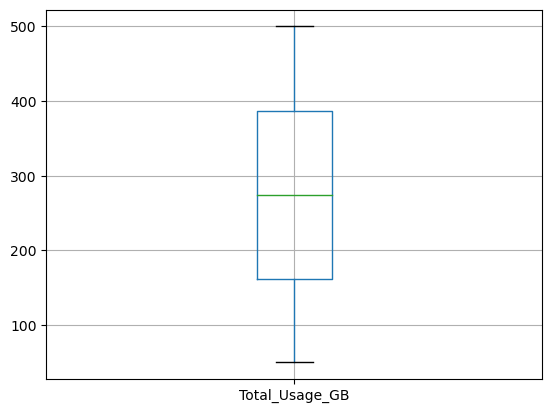

In [76]:
data.boxplot('Total_Usage_GB')

In [72]:
data[(data['Total_Usage_GB'] > 500) | (data['Total_Usage_GB'] < 10) ]

,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn


## creating some columns for feature engineering and getting an intuition of the data

In [80]:
data['Total Bill'] = data['Monthly_Bill'] * data['Subscription_Length_Months']

In [343]:
data['avg monthly usage'] = data['Total_Usage_GB']/data['Subscription_Length_Months']

In [344]:
data

,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn,Total Bill,avg monthly usage
0,1,Customer_1,63,0,0,17,73.36,236,0,1247.12,13.882353
1,2,Customer_2,62,1,1,1,48.76,172,0,48.76,172.000000
2,3,Customer_3,24,1,0,5,85.47,460,0,427.35,92.000000
3,4,Customer_4,36,1,2,3,97.94,297,1,293.82,99.000000
4,5,Customer_5,46,1,2,19,58.14,266,0,1104.66,14.000000
...,...,...,...,...,...,...,...,...,...,...,...
99995,99996,Customer_99996,33,0,4,23,55.13,226,1,1267.99,9.826087
99996,99997,Customer_99997,62,1,1,19,61.65,351,0,1171.35,18.473684
99997,99998,Customer_99998,64,0,3,17,96.11,251,1,1633.87,14.764706
99998,99999,Customer_99999,51,1,1,20,49.25,434,1,985.00,21.700000


In [327]:
data_heatmap = data[['Age', 'Gender', 'Location', 'Subscription_Length_Months', 'Monthly_Bill', 'Total_Usage_GB', 'Churn']]

In [329]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_heatmap.drop('Churn', axis = 1))

In [333]:
scaled_data = pd.DataFrame(scaled_data)

<Axes: >

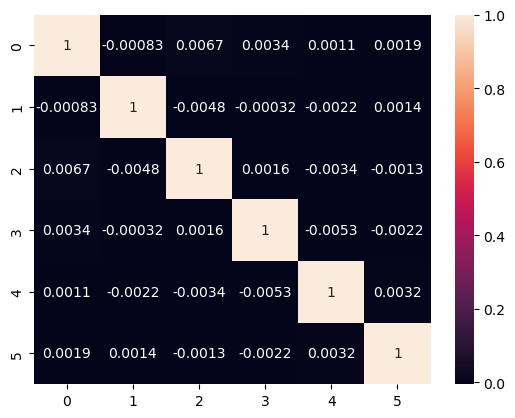

In [334]:
sns.heatmap(scaled_data.corr(), annot = True)

In [86]:
pd.DataFrame(data_heatmap.corr())

,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn,Total Bill
Age,1.000000,-0.000832,0.006660,0.003382,0.001110,0.001927,0.001559,0.004375
Gender,-0.000832,1.000000,-0.004848,-0.000320,-0.002239,0.001385,-0.002121,-0.001353
Location,0.006660,-0.004848,1.000000,0.001574,-0.003367,-0.001251,-0.002594,-0.000778
Subscription_Length_Months,0.003382,-0.000320,0.001574,1.000000,-0.005294,-0.002203,0.002328,0.841891
Monthly_Bill,0.001110,-0.002239,-0.003367,-0.005294,1.000000,0.003187,-0.000211,0.466938
Total_Usage_GB,0.001927,0.001385,-0.001251,-0.002203,0.003187,1.000000,-0.002842,0.000199
Churn,0.001559,-0.002121,-0.002594,0.002328,-0.000211,-0.002842,1.000000,0.001325
Total Bill,0.004375,-0.001353,-0.000778,0.841891,0.466938,0.000199,0.001325,1.000000


<Axes: xlabel='Monthly_Bill', ylabel='Total_Usage_GB'>

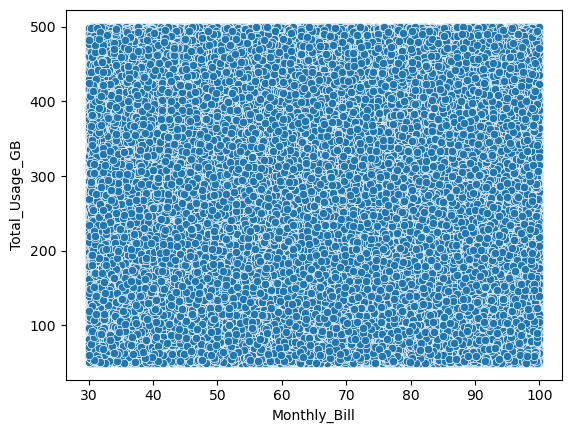

In [342]:
sns.scatterplot(data = data_heatmap, x = 'Monthly_Bill', y = 'Total_Usage_GB')

## The data given has no correlation at all as shown by the heatmap and the scatterplots. This is possible if the data was generated randomly. Any machine learning model fitted on this dataset will not perform well.

In [456]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, confusion_matrix
import pickle

In [502]:
def train(data, model):
    model_name = model
    X = data.drop(['Churn'], axis = 1)
    y = data['Churn']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test) 
    model = eval(model)()
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    #fpr, tpr, thre = roc_curve(y_test, predictions)
    #plt.plot(fpr, tpr)
    print('Confusion Matrix : ', confusion_matrix(y_test, predictions))
    print('Accuracy Score : ', accuracy_score(y_test, predictions))
    with open(f'{model_name}_model.pkl', 'wb') as model_file:
        pickle.dump(model, model_file)

In [503]:
for model in ['SVC', 'LogisticRegression', 'RandomForestClassifier', 'XGBClassifier']:
    train(data_heatmap, model)

Confusion Matrix :  [[5804 4275]
 [5811 4110]]
Accuracy Score :  0.4957
Confusion Matrix :  [[6688 3391]
 [6599 3322]]
Accuracy Score :  0.5005
Confusion Matrix :  [[5218 4861]
 [5236 4685]]
Accuracy Score :  0.49515
Confusion Matrix :  [[5196 4883]
 [5072 4849]]
Accuracy Score :  0.50225


## As we can see from the confusion matrices, none of the different applied Machine Learning algorithms performs more than 0.5 or 50% accuracy. This is due to negligible correlation between features and any optimization (can be done using GridSearchCV on all hyper-parameters of the model) won't help much.

## We also train a Neural Network of 3 layers to check if it can find some patterns

In [192]:
import torch
import torch.nn as nn
from torch import optim
from tqdm import tqdm
import copy

In [432]:
class Deep(nn.Module):
    def __init__(self):
        super().__init__()
        self.layer1 = nn.Linear(6, 8)
        self.act1 = nn.Tanh()
        self.layer2 = nn.Linear(8, 8)
        self.act2 = nn.Tanh()
        self.layer3 = nn.Linear(8, 8)
        self.act3 = nn.Tanh()
        self.output = nn.Linear(8, 1)
        self.sigmoid = nn.Sigmoid()
 
    def forward(self, x):
        x = self.act1(self.layer1(x))
        x = self.act2(self.layer2(x))
        x = self.act3(self.layer3(x))
        x = self.sigmoid(self.output(x))
        return x

In [504]:
X = data_heatmap.drop(['Churn'], axis = 1)
y = data_heatmap['Churn']

In [505]:
X = torch.tensor(X.values, dtype = torch.float32)
y = torch.tensor(y, dtype=torch.float32).reshape(-1, 1)

In [506]:
X.shape

torch.Size([100000, 6])

In [507]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [508]:
def model_train(model, X_train, y_train, X_val, y_val):
    # loss function and optimizer
    loss_fn = nn.BCELoss()  # binary cross entropy
    optimizer = optim.Adam(model.parameters(), lr=0.001)
 
    n_epochs =1000 # number of epochs to run
    batch_size = 500 # size of each batch
    batch_start = torch.arange(0, len(X_train), batch_size)
    model_name = 'Neural Network'
    # Hold the best model
    best_acc = - np.inf   # init to negative infinity
    best_weights = None
    train_loss = []
    val_loss = []
    for epoch in range(n_epochs):
        model.train()
        trainloss = 0
        valloss = 0
        
        with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
            bar.set_description(f"Epoch {epoch}")
            for start in bar:
                # take a batch
                X_batch = X_train[start:start+batch_size]
                y_batch = y_train[start:start+batch_size]
                # forward pass
                #print(X_batch.shape)
                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)
                # backward pass
                optimizer.zero_grad()
                loss.backward()
                # update weights
                optimizer.step()
                # print progress
                acc = (y_pred.round() == y_batch).float().mean()
                bar.set_postfix(
                    loss=float(loss),
                    acc=float(acc)
                )
                trainloss += loss.item()/len(X_batch)
            train_loss.append(trainloss)
                #print(trainloss)
        
        # evaluate accuracy at end of each epoch
        model.eval()
        y_pred = model(X_val)
        valloss += loss_fn(y_pred, y_val).item()/len(X_val)
        val_loss.append(valloss)
        #print(valloss)
        acc = (y_pred.round() == y_val).float().mean()
        acc = float(acc)
        if acc > best_acc:
            best_acc = acc
            best_weights = copy.deepcopy(model.state_dict())
    plt.plot(train_loss, label='Training Loss', color='blue')
    plt.plot(val_loss, label='Validation Loss', color='red')
    # restore model and return best accuracy
    model.load_state_dict(best_weights)
    with open(f'{model_name}_model.pkl', 'wb') as model_file:
        pickle.dump(model, model_file)
    return (train_loss, val_loss)

In [509]:
model = Deep()

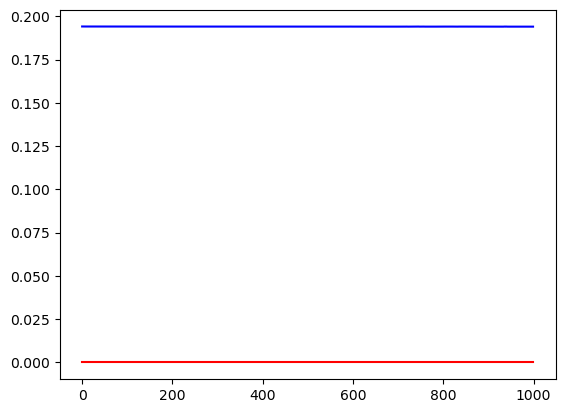

In [510]:
loss_tr, loss_val = model_train(model, X_train, y_train, X_train, y_train)


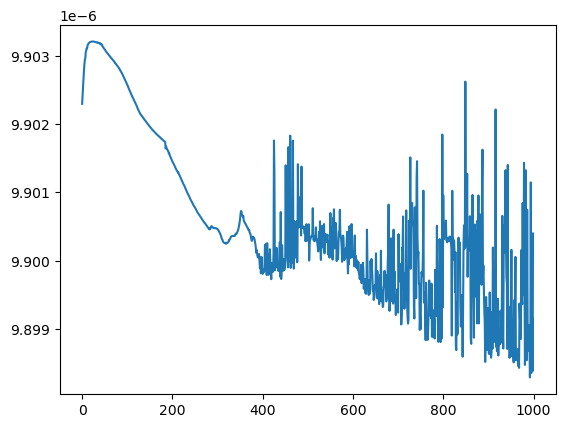

In [511]:
plt.plot(loss_val)

## As expected, the neural network also performs badly. A better intuition of this is demonstrated below

In [222]:
from sklearn.decomposition import PCA

In [224]:
pca_1 = PCA(n_components=2)
pca_2 = PCA(n_components=3)

In [270]:
all_corrd = pca_1.fit_transform(data_heatmap.drop('Churn', axis = 1))
three_d_data = pca_2.fit_transform(data_heatmap.drop('Churn', axis = 1))

In [274]:
temp_data = data_heatmap.drop('Churn', axis = 1)
three_d_data.shape

(100000, 3)

In [264]:
from numpy.linalg import eig

In [267]:
temp_np_array = temp_data.to_numpy()
eig(np.cov(temp_np_array.T))

(array([2.85128554e+05, 1.70206151e+04, 2.33480994e+02, 3.29826824e+02,
        4.10578602e+00, 2.00550377e+00, 2.49989179e-01]),
 array([[ 1.25292271e-04,  2.28683632e-04,  9.99995453e-01,
         -2.91725517e-03,  3.53379978e-04,  6.24028394e-04,
          2.60091280e-05],
        [-1.26775358e-06,  5.31038713e-06, -2.73726760e-05,
         -5.01267156e-05, -1.17848094e-05,  1.95559998e-03,
          9.99998086e-01],
        [-2.06922986e-06, -1.35791071e-05,  6.22077264e-04,
         -2.70945371e-04,  3.14567081e-03, -9.99992910e-01,
          1.95563044e-03],
        [ 1.09176794e-02, -1.28211146e-04, -8.59439264e-04,
         -1.74198404e-01,  9.84644647e-01,  3.14402655e-03,
         -3.28561234e-06],
        [ 1.77086435e-02,  4.88298797e-04,  2.80830056e-03,
          9.84583508e-01,  1.73992849e-01,  2.82361227e-04,
          5.09490498e-05],
        [ 5.20966978e-05,  9.99999845e-01, -2.30165353e-04,
         -5.03364143e-04,  4.04223376e-05, -1.34693436e-05,
         -5.315

Text(0.5, 0.92, 'simple 3D scatter plot')

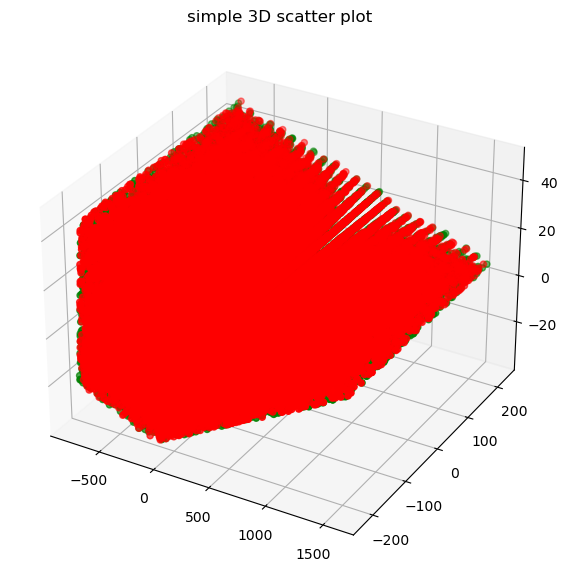

In [298]:
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
# Creating plot
zero_arr = np.where(data_heatmap['Churn'] == 0)
one_arr = np.where(data_heatmap['Churn'] == 1)
ax.scatter3D(three_d_data[zero_arr,0], three_d_data[zero_arr,1], three_d_data[zero_arr,2], color = "green")
ax.scatter3D(three_d_data[one_arr,0], three_d_data[one_arr,1], three_d_data[one_arr,2], color = "red")
plt.title("simple 3D scatter plot")

In [465]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Sample data (x, y, z coordinates)
x = three_d_data[zero_arr,0]
y = three_d_data[zero_arr,1]
z = three_d_data[zero_arr,2]

x_1 = three_d_data[one_arr,0]
y_1 = three_d_data[one_arr,1]
z_1 = three_d_data[one_arr,2]

import plotly.graph_objs as go

# Create a scatter3d trace
trace = go.Scatter3d(
    x=x[0],
    y=y[0],
    z=z[0],
    mode='markers',
    marker=dict(size=5, color='blue'),
    text='Data Points'
)

trace_1 = go.Scatter3d(
    x=x_1[0],
    y=y_1[0],
    z=z_1[0],
    mode='markers',
    marker=dict(size=5, color='red'),
    text='Data Points'
)


# Create a layout for the interactive plot
layout = go.Layout(
    scene=dict(
        xaxis=dict(title='X Label', range=[-500, 500]),
        yaxis=dict(title='Y Label', range=[-500, 500]),
        zaxis=dict(title='Z Label', range=[-50, 50])
    ),
    title='Interactive 3D Scatter Plot'
)

# Create a Figure object
fig = go.Figure(data=[trace, trace_1], layout=layout)

# Display the interactive plot in a web browser
fig.show()



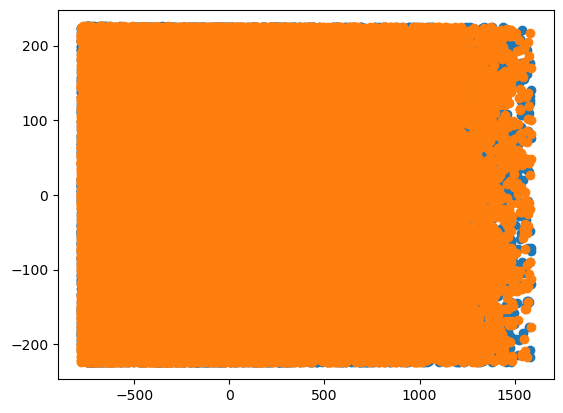

In [466]:
x = [x[0] for x in all_corrd]
y = [x[1] for x in all_corrd]
zero_arr = np.where(data_heatmap['Churn'] == 0)
selected_x_0 = [x[i] for i in zero_arr[0]]
selected_y_0 = [y[i] for i in zero_arr[0]]

one_arr = np.where(data_heatmap['Churn'] == 1)
selected_x_1 = [x[i] for i in one_arr[0]]
selected_y_1 = [y[i] for i in one_arr[0]]

plt.scatter(x = selected_x_1, y = selected_y_1)
plt.scatter(x = selected_x_0, y = selected_y_0)

## As we can see, when the features are projected in 2 and 3 dimensions using Principal Component Analysis, the final outputs show that there is absolutely no clustering of the 0 and 1 churn data points. This clearly explains why we've been getting such low accuracy in all of our models.

## Finally we develop a simple web application using flask to deploy our model for the user. Note : since none of the models performed satifactorily enough, we let the user decide which model he wants to use for prediction services.

In [501]:
from flask import Flask,render_template,request
import pickle
import numpy as np

#model = pickle.load(open('model.pkl','rb'))
app = Flask(__name__, template_folder = 'New folder')

@app.route('/')
def index():
    return render_template('index.html')

@app.route('/predict',methods=['POST'])
def predict_placement():
    model = str(request.form.get('model'))
    age = int(request.form.get('age'))
    gender = int(request.form.get('gender'))
    location = int(request.form.get('location'))
    subs_len_months = int(request.form.get('sub_len'))
    monthly_bill = int(request.form.get('monthly_bill'))
    usage = int(request.form.get('usage'))

    model_to_use = pickle.load(open(f'{model}_model.pkl','rb'))
    if model != 'Neural Network':
        result = model_to_use.predict(np.array([age, gender, location, subs_len_months, monthly_bill, usage]).reshape(1,6))
    elif model == 'Neural Network':
        input_data = torch.tensor(np.array([age, gender, location, subs_len_months, monthly_bill, usage]), dtype=torch.float32)
        output = model_to_use(input_data)
        if output >= 0.5:
            result = "Churn"
        else:
            result = 'Not Churn'
    else: 
        result = 'Invalid Model'
    if result[0] == 1:
        result = 'Churn'
    else:
        result = 'Not Churn'

    return render_template('index.html',result=result)

if __name__ == '__main__':
    app.run(host='0.0.0.0',port=8080)

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on all addresses (0.0.0.0)
 * Running on http://127.0.0.1:8080
 * Running on http://192.168.29.100:8080
Press CTRL+C to quit
192.168.29.100 - - [06/Sep/2023 14:19:37] "GET / HTTP/1.1" 200 -
192.168.29.100 - - [06/Sep/2023 14:19:50] "POST /predict HTTP/1.1" 200 -
